1) load a data for a test
2) update a loop for test
3) for each epoch display a training loss , validation loss and test loss + ssim value also

# Data Loading

## Train

In [22]:
X_train_path = '/home/simlab120/Denoise_comp/Pragyant/image-impeccable-train-data-part1/42487393/seismic_w_noise_vol_42487393.npy'
y_train_path = '/home/simlab120/Denoise_comp/Pragyant/image-impeccable-train-data-part1/42487393/seismicCubes_RFC_fullstack_2024.42487393.npy'

## Test

In [23]:
X_test_path = '/home/simlab120/Denoise_comp/Pragyant/image-impeccable-test-data/2024-06-10_0d6402b1/seismic_w_noise_vol_44319345.npy'
y_test_path = '/home/simlab120/Denoise_comp/Pragyant/image-impeccable-train-data-part1/42487919/seismicCubes_RFC_fullstack_2024.42487919.npy'

## Valid

In [24]:
X_valid_path = '/home/simlab120/Denoise_comp/Pragyant/image-impeccable-train-data-part1/42502775/seismic_w_noise_vol_42502775.npy'
y_valid_path = '/home/simlab120/Denoise_comp/Pragyant/image-impeccable-train-data-part1/42502775/seismicCubes_RFC_fullstack_2024.42502775.npy'

In [25]:
shape = (1259,300,300)
# load the data
# make the data in 2d section
# make the train set and test set
# print the image also

In [26]:
import os
import pandas as pd
import numpy as np
from torchvision.io import read_image
from torch.utils.data import Dataset,DataLoader
import torch
# 2 files
# 1259*300*300 ---> 1259*300 in 300 images
# x,y load
# x,y sub sample
# pair
# return
class volDataset(Dataset):
    def __init__(self, x_slices, y_slices, transform=None):
        """
        x_slices: List of noisy seismic slices (each of shape 1259x300)
        y_slices: List of clean seismic slices (each of shape 1259x300)
        """
        self.x_slices = x_slices
        self.y_slices = y_slices
        self.transform = transform

    def __len__(self):
        return len(self.x_slices)

    def __getitem__(self, idx):
        """Returns one slice (1, 1259, 300)"""
        x_slice = torch.tensor(self.x_slices[idx], dtype=torch.float32).unsqueeze(0)  # (1, 1259, 300)
        y_slice = torch.tensor(self.y_slices[idx], dtype=torch.float32).unsqueeze(0)  # (1, 1259, 300)

        if self.transform:
            x_slice = self.transform(x_slice)
            y_slice = self.transform(y_slice)

        return x_slice, y_slice

In [27]:
from sklearn.model_selection import train_test_split
# Convert volume to 2D slices
# Load seismic volumes
X_volume = np.load('/home/simlab120/Denoise_comp/Pragyant/image-impeccable-train-data-part1/42487393/seismic_w_noise_vol_42487393.npy',allow_pickle=True)  # (1259, 300, 300)
y_volume = np.load('/home/simlab120/Denoise_comp/Pragyant/image-impeccable-train-data-part1/42487393/seismicCubes_RFC_fullstack_2024.42487393.npy',allow_pickle=True)  # (1259, 300, 300)

X_volume_t = np.load(X_test_path,allow_pickle=True)
y_volume_t = np.load(y_test_path,allow_pickle=True)

X_volume_v = np.load(X_valid_path,allow_pickle=True)
y_volume_v = np.load(y_valid_path,allow_pickle=True)
# Convert volume to 2D slices

X_slices = [X_volume[:, :, i] for i in range(X_volume.shape[2])]  # List of 300 slices
y_slices = [y_volume[:, :, i] for i in range(y_volume.shape[2])]  # List of 300 slices

X_slices_t = [X_volume_t[:, :, i] for i in range(X_volume_t.shape[2])]
y_slices_t = [y_volume_t[:, :, i] for i in range(y_volume_t.shape[2])]

X_slices_v = [X_volume_v[:, :, i] for i in range(X_volume_v.shape[2])]
y_slices_v = [y_volume_v[:, :, i] for i in range(y_volume_v.shape[2])]

# Create datasets
train_dataset = volDataset(X_slices, y_slices)
valid_dataset = volDataset(X_slices_v,y_slices_v)

# Create dataloaders
train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)
val_loader = DataLoader(valid_dataset,batch_size=8, shuffle=False)

# Check batch shapes
for x_batch, y_batch in train_loader:
    print("Train Batch Shape:", x_batch.shape, y_batch.shape)  # Expected: (8, 1, 1259, 300)
    break
for x_batch, y_batch in val_loader:
    print("valid Batch Shape:", x_batch.shape, y_batch.shape)  # Expected: (8, 1, 1259, 300)
    break

Train Batch Shape: torch.Size([8, 1, 1259, 300]) torch.Size([8, 1, 1259, 300])
valid Batch Shape: torch.Size([8, 1, 1259, 300]) torch.Size([8, 1, 1259, 300])


# Model

In [28]:
import os
import torch
from torch import nn
from torch.utils.data import DataLoader
from torchvision import datasets, transforms

In [29]:
class Crop2d(nn.Module):
    def __init__(self, left=10, right=10, top=21, bottom=0):
        super(Crop2d, self).__init__()
        self.left = left
        self.right = right
        self.top = top
        self.bottom = bottom

    def forward(self, x):
        return x[:, :, self.top:x.shape[2] - self.bottom, self.left:x.shape[3] - self.right]

In [30]:
pip install timm

Note: you may need to restart the kernel to use updated packages.


In [31]:
pip install segmentation_models_pytorch

Note: you may need to restart the kernel to use updated packages.


In [32]:
import timm
from segmentation_models_pytorch.decoders.unetplusplus import UnetPlusPlus

In [33]:
from segmentation_models_pytorch import UnetPlusPlus
from segmentation_models_pytorch.encoders import get_encoder

class cnn_model(nn.Module):
    def __init__(self):
        super().__init__()

        # Zero padding before encoding
        self.zero_pad = nn.ZeroPad2d((10, 10, 21, 0))

        # EfficientNet-B3 as the encoder
        self.encoder = timm.create_model("efficientnet_b3", features_only=True, pretrained=True, in_chans=1)

        # UNet++ decoder
        self.decoder = UnetPlusPlus(
            encoder_name="timm-efficientnet-b3",  # Use a supported encoder
            encoder_weights="imagenet",
            in_channels=1,
            classes=1  
        )

        # Cropping after decoding
        self.crop = Crop2d(10, 10, 21, 0)

    def forward(self, x):
        x = self.zero_pad(x)
        x = self.decoder(x)  # Decoder already includes an encoder
        x = self.crop(x)
        return x

    
model = cnn_model()
x = torch.randn(1,1,1259,300)
output = model(x)

print(output.shape)
        

Unexpected keys (bn2.bias, bn2.num_batches_tracked, bn2.running_mean, bn2.running_var, bn2.weight, classifier.bias, classifier.weight, conv_head.weight) found while loading pretrained weights. This may be expected if model is being adapted.


torch.Size([1, 1, 1259, 300])


In [34]:
pip install torcheval

Note: you may need to restart the kernel to use updated packages.


In [35]:
import torch
import torch.nn as nn
import torch.optim as optim

# Define model
model = cnn_model()

# Define Loss Function (MSE for denoising)
criterion = nn.MSELoss()

# Define Optimizer (Adam works well)
optimizer = optim.Adam(model.parameters(), lr=0.1)

Unexpected keys (bn2.bias, bn2.num_batches_tracked, bn2.running_mean, bn2.running_var, bn2.weight, classifier.bias, classifier.weight, conv_head.weight) found while loading pretrained weights. This may be expected if model is being adapted.


In [36]:
# Check batch shapes
for x_batch, y_batch in train_loader:
    print("Train Batch Shape:", x_batch.shape, y_batch.shape)  # Expected: (batch_size, 1, 1259, 300)
    break

Train Batch Shape: torch.Size([8, 1, 1259, 300]) torch.Size([8, 1, 1259, 300])


In [37]:
from torchmetrics import StructuralSimilarityIndexMeasure
ssim_metric = StructuralSimilarityIndexMeasure()

In [38]:
import matplotlib.pyplot as plt

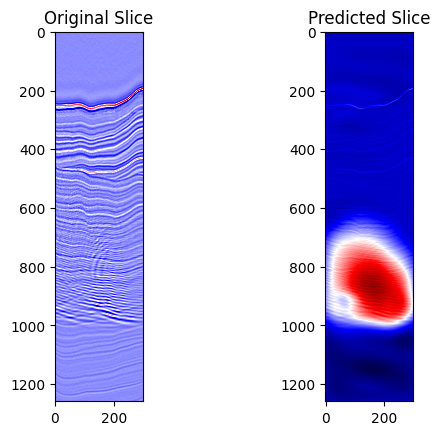

Epoch [1/200], Train Loss: 2515.3003, Train SSIM: 0.7429,           Val Loss: 839298.7159, Val SSIM: 0.2043


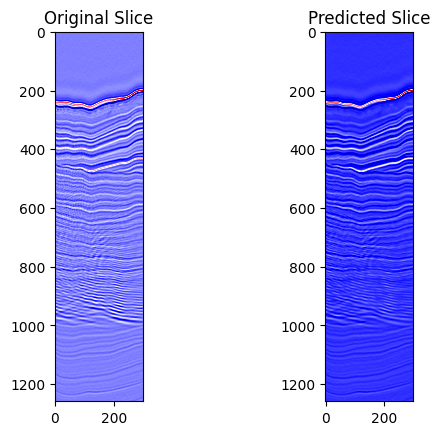

Epoch [2/200], Train Loss: 618.6648, Train SSIM: 0.8551,           Val Loss: 890.5007, Val SSIM: 0.7129


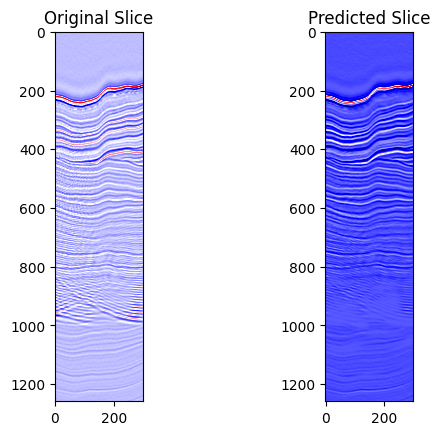

Epoch [3/200], Train Loss: 485.4307, Train SSIM: 0.8743,           Val Loss: 945.9036, Val SSIM: 0.7897


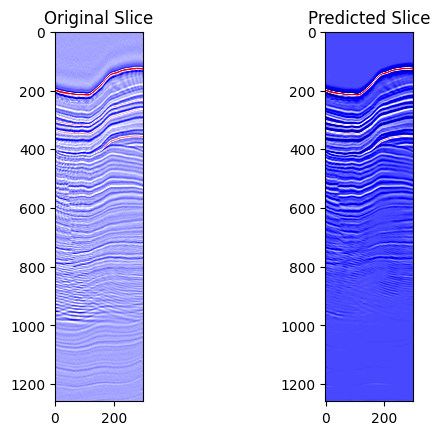

Epoch [4/200], Train Loss: 401.9928, Train SSIM: 0.8880,           Val Loss: 1133.8676, Val SSIM: 0.7505


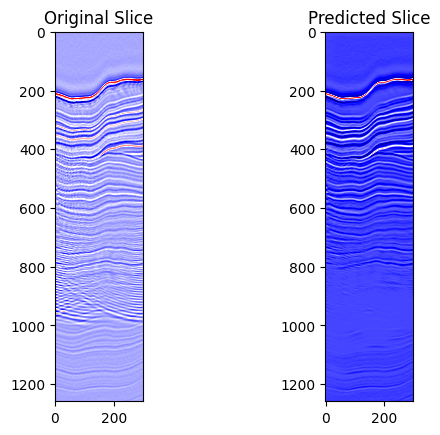

Epoch [5/200], Train Loss: 358.9122, Train SSIM: 0.8976,           Val Loss: 1051.0153, Val SSIM: 0.8001


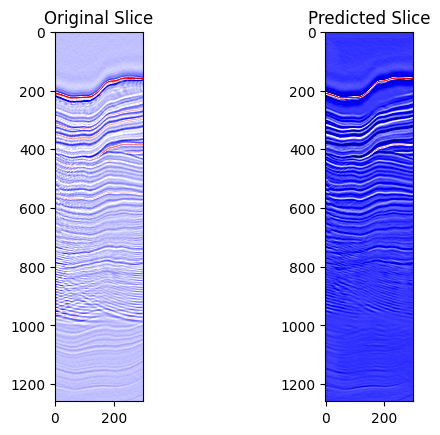

Epoch [6/200], Train Loss: 327.9134, Train SSIM: 0.9034,           Val Loss: 984.4087, Val SSIM: 0.7597


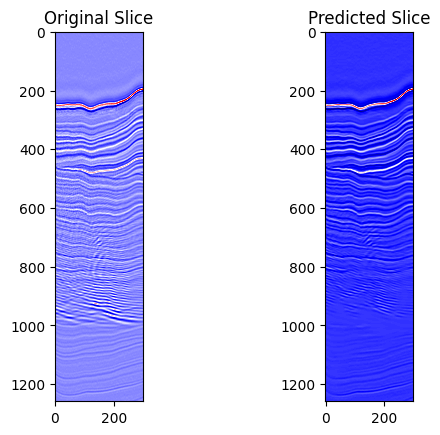

Epoch [7/200], Train Loss: 285.6483, Train SSIM: 0.9138,           Val Loss: 1088.5636, Val SSIM: 0.7256


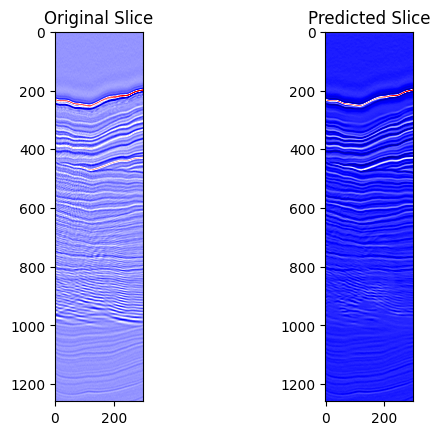

Epoch [8/200], Train Loss: 242.6689, Train SSIM: 0.9235,           Val Loss: 822.1520, Val SSIM: 0.8222


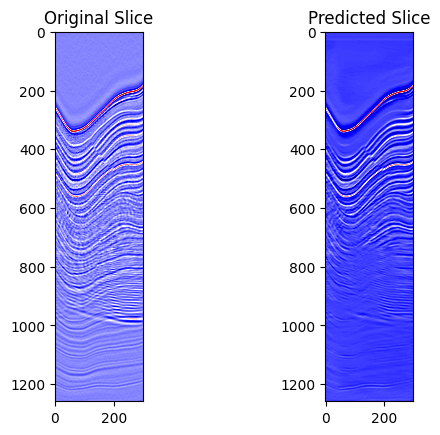

Epoch [9/200], Train Loss: 230.1907, Train SSIM: 0.9268,           Val Loss: 1706.7186, Val SSIM: 0.6709


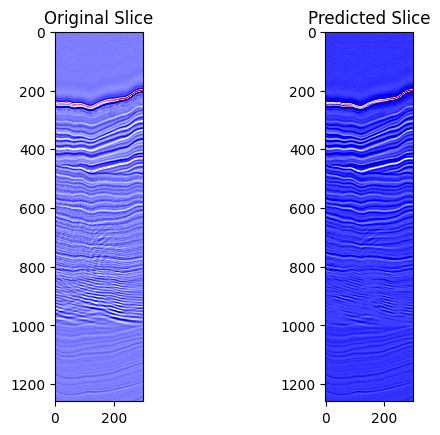

Epoch [10/200], Train Loss: 207.6679, Train SSIM: 0.9329,           Val Loss: 547.5179, Val SSIM: 0.8976


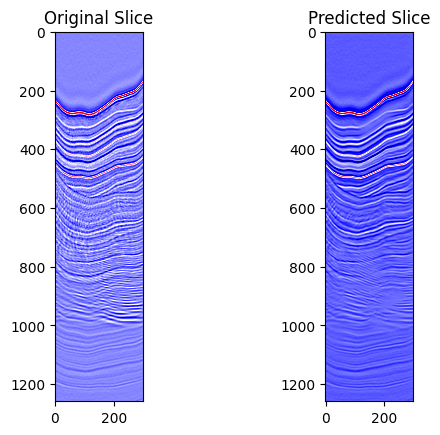

Epoch [11/200], Train Loss: 197.9928, Train SSIM: 0.9360,           Val Loss: 842.8660, Val SSIM: 0.8518


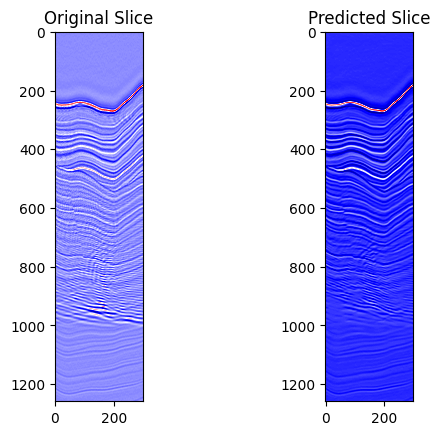

Epoch [12/200], Train Loss: 163.8387, Train SSIM: 0.9442,           Val Loss: 837.5094, Val SSIM: 0.8644


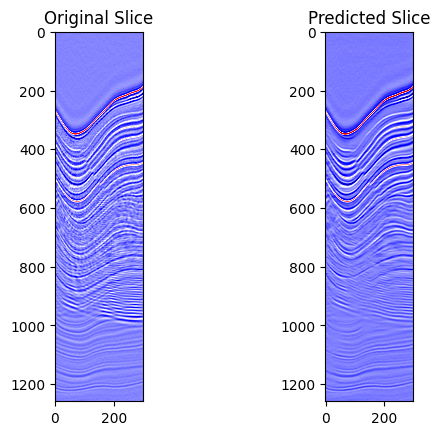

Epoch [13/200], Train Loss: 154.3679, Train SSIM: 0.9481,           Val Loss: 894.0867, Val SSIM: 0.7893


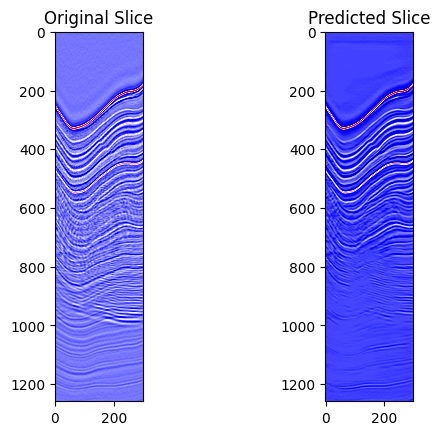

Epoch [14/200], Train Loss: 149.5084, Train SSIM: 0.9504,           Val Loss: 1423.4852, Val SSIM: 0.7430


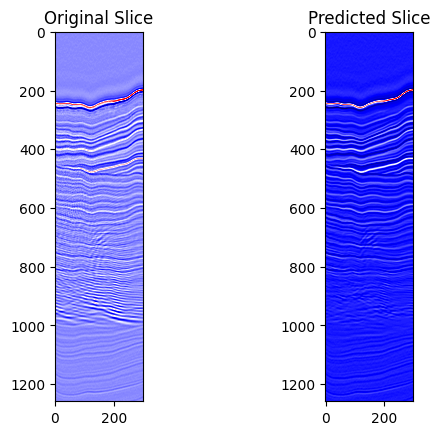

Epoch [15/200], Train Loss: 155.2169, Train SSIM: 0.9505,           Val Loss: 1305.9106, Val SSIM: 0.7339


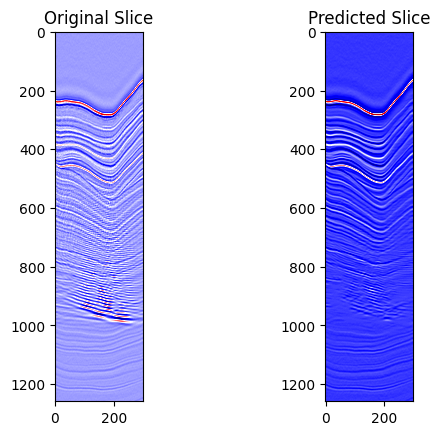

Epoch [16/200], Train Loss: 129.0916, Train SSIM: 0.9567,           Val Loss: 1309.2197, Val SSIM: 0.7551


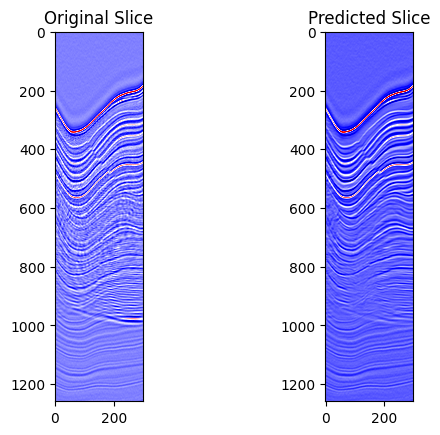

Epoch [17/200], Train Loss: 118.2791, Train SSIM: 0.9606,           Val Loss: 817.4626, Val SSIM: 0.8180


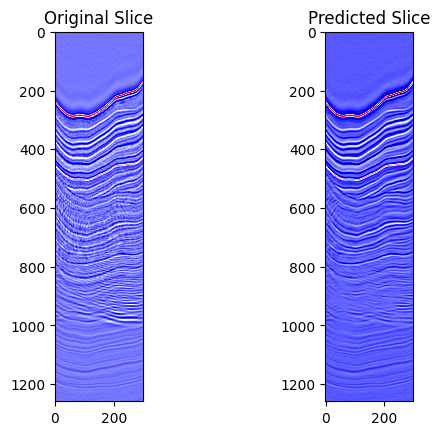

Epoch [18/200], Train Loss: 107.5353, Train SSIM: 0.9635,           Val Loss: 720.4046, Val SSIM: 0.8795


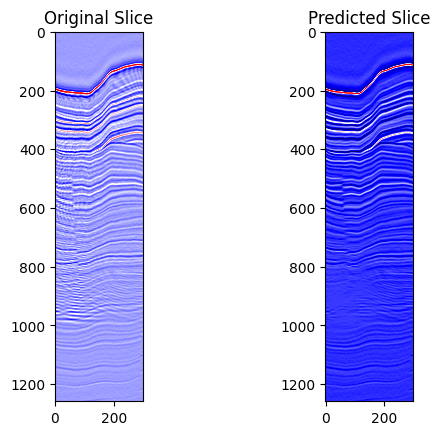

Epoch [19/200], Train Loss: 106.1480, Train SSIM: 0.9645,           Val Loss: 869.7239, Val SSIM: 0.8572


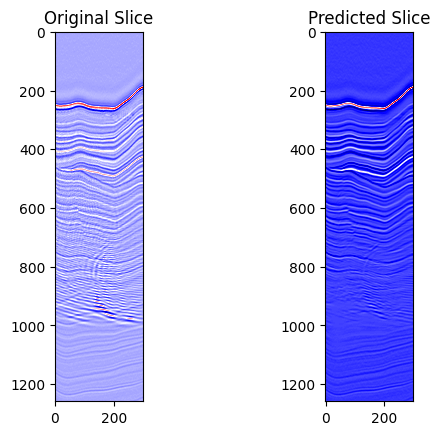

Epoch [20/200], Train Loss: 103.6310, Train SSIM: 0.9670,           Val Loss: 927.4116, Val SSIM: 0.8485


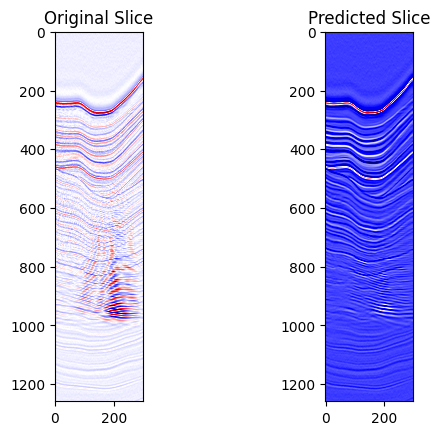

Epoch [21/200], Train Loss: 107.4371, Train SSIM: 0.9656,           Val Loss: 787.5156, Val SSIM: 0.8171


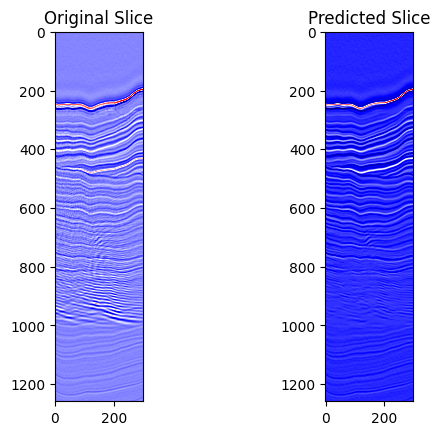

Epoch [22/200], Train Loss: 102.3704, Train SSIM: 0.9666,           Val Loss: 836.6208, Val SSIM: 0.8731


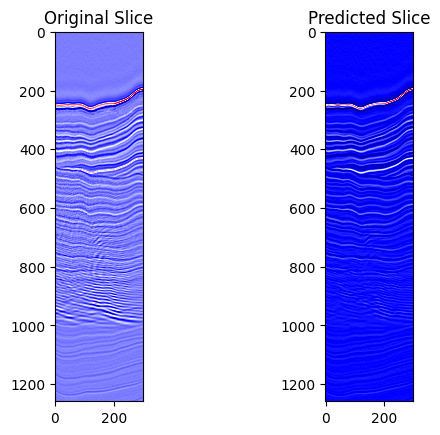

Epoch [23/200], Train Loss: 89.1439, Train SSIM: 0.9707,           Val Loss: 802.2812, Val SSIM: 0.8947


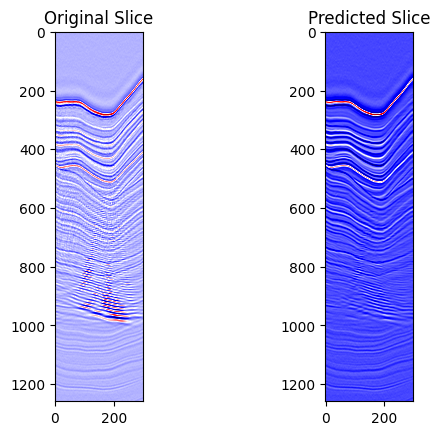

Epoch [24/200], Train Loss: 94.6673, Train SSIM: 0.9694,           Val Loss: 916.6183, Val SSIM: 0.7823


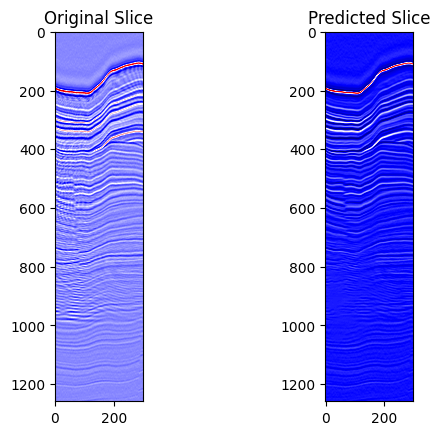

Epoch [25/200], Train Loss: 90.1828, Train SSIM: 0.9717,           Val Loss: 1128.7320, Val SSIM: 0.7872


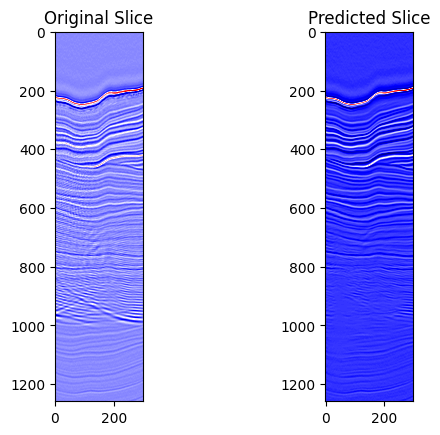

Epoch [26/200], Train Loss: 87.2046, Train SSIM: 0.9727,           Val Loss: 1058.9077, Val SSIM: 0.7859


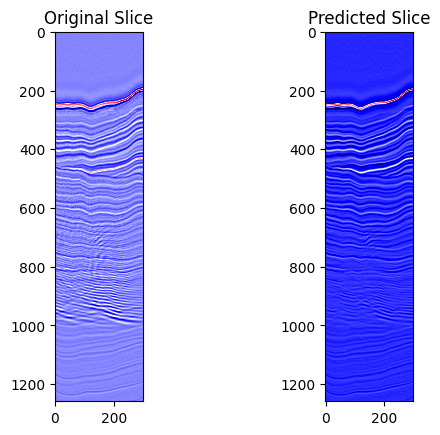

Epoch [27/200], Train Loss: 80.1039, Train SSIM: 0.9743,           Val Loss: 777.8015, Val SSIM: 0.8819


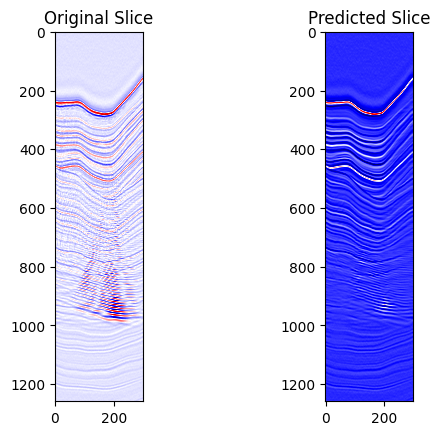

Epoch [28/200], Train Loss: 80.2110, Train SSIM: 0.9743,           Val Loss: 797.8456, Val SSIM: 0.8787


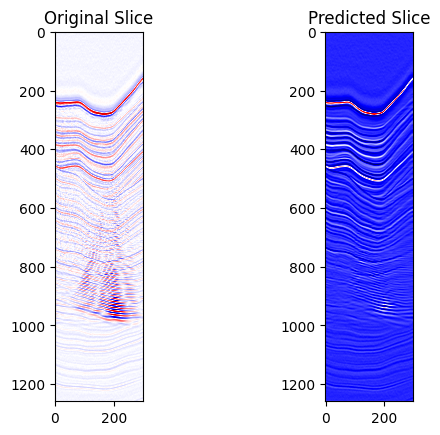

Epoch [29/200], Train Loss: 79.0023, Train SSIM: 0.9757,           Val Loss: 824.2623, Val SSIM: 0.8790


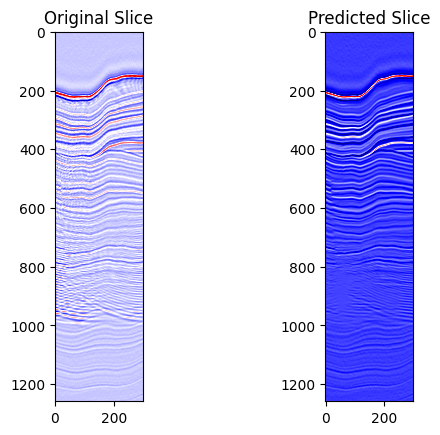

Epoch [30/200], Train Loss: 84.4620, Train SSIM: 0.9743,           Val Loss: 912.2595, Val SSIM: 0.8626


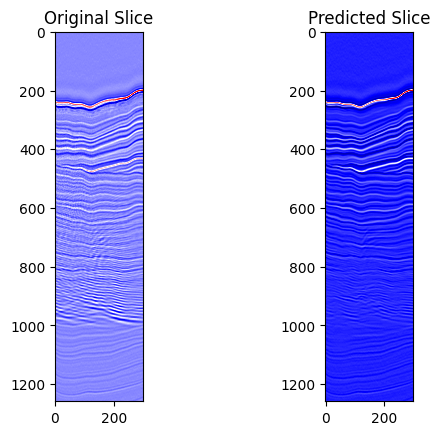

Epoch [31/200], Train Loss: 78.5011, Train SSIM: 0.9758,           Val Loss: 882.5185, Val SSIM: 0.8532


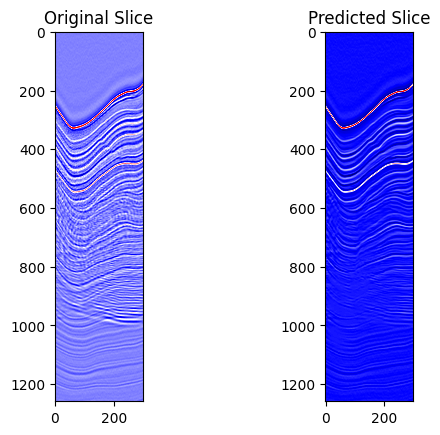

Epoch [32/200], Train Loss: 78.8825, Train SSIM: 0.9759,           Val Loss: 1121.9023, Val SSIM: 0.8371


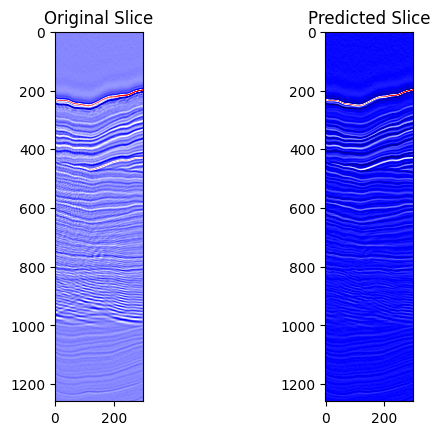

Epoch [33/200], Train Loss: 75.9346, Train SSIM: 0.9767,           Val Loss: 783.7001, Val SSIM: 0.8861


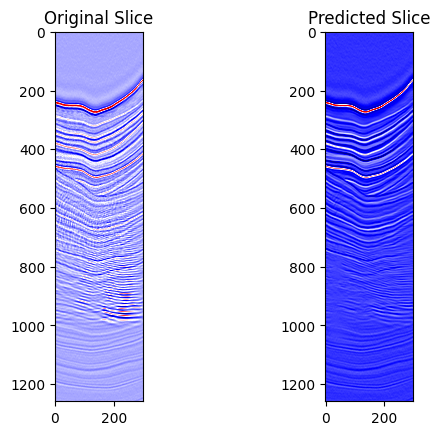

Epoch [34/200], Train Loss: 72.8667, Train SSIM: 0.9781,           Val Loss: 960.9784, Val SSIM: 0.8651


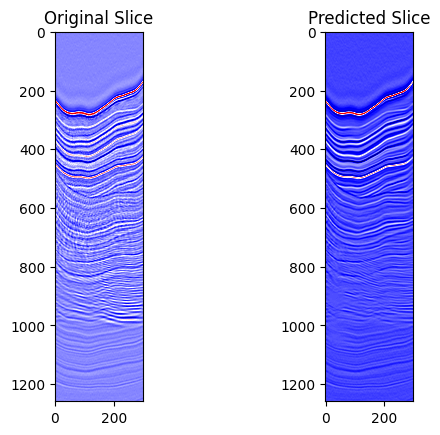

Epoch [35/200], Train Loss: 79.1943, Train SSIM: 0.9764,           Val Loss: 940.3758, Val SSIM: 0.8625


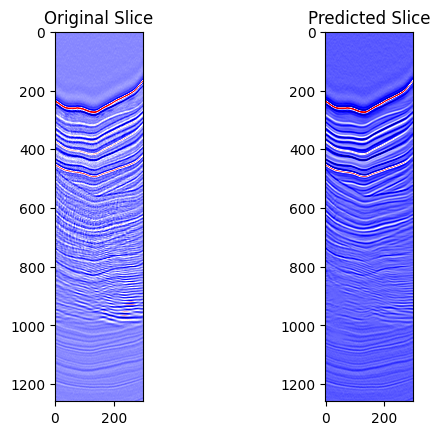

Epoch [36/200], Train Loss: 71.7916, Train SSIM: 0.9779,           Val Loss: 878.4672, Val SSIM: 0.8686


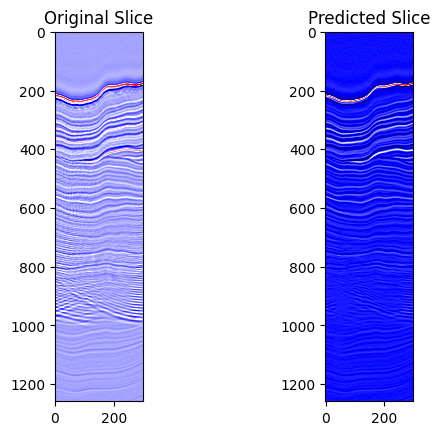

Epoch [37/200], Train Loss: 69.1556, Train SSIM: 0.9793,           Val Loss: 946.2594, Val SSIM: 0.8514


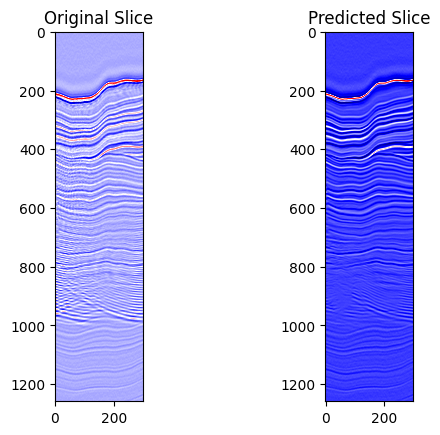

Epoch [38/200], Train Loss: 64.5939, Train SSIM: 0.9804,           Val Loss: 781.5839, Val SSIM: 0.8407


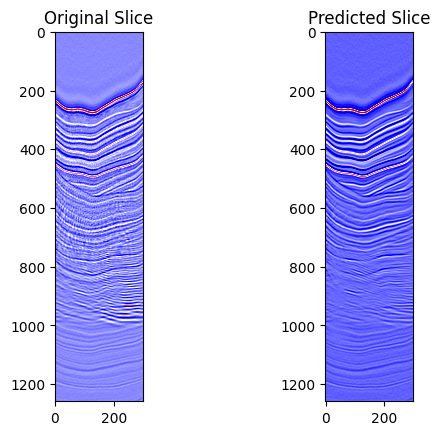

Epoch [39/200], Train Loss: 67.8041, Train SSIM: 0.9800,           Val Loss: 825.6608, Val SSIM: 0.8800


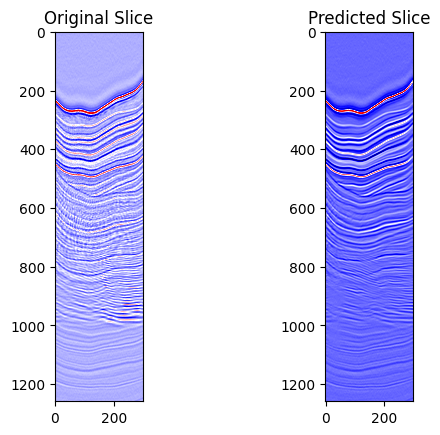

Epoch [40/200], Train Loss: 70.9840, Train SSIM: 0.9793,           Val Loss: 923.5778, Val SSIM: 0.7539


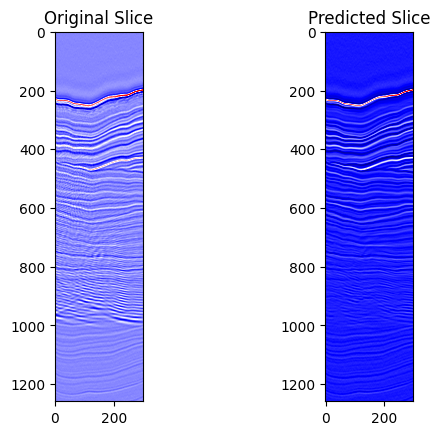

Epoch [41/200], Train Loss: 62.2338, Train SSIM: 0.9810,           Val Loss: 979.8243, Val SSIM: 0.8139


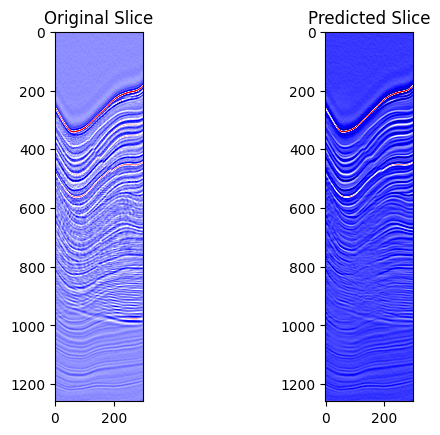

Epoch [42/200], Train Loss: 58.9986, Train SSIM: 0.9820,           Val Loss: 804.9587, Val SSIM: 0.8670


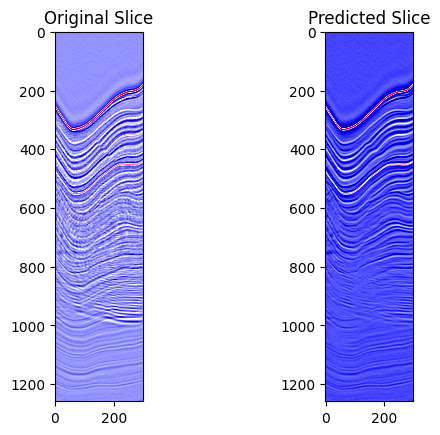

Epoch [43/200], Train Loss: 66.0400, Train SSIM: 0.9806,           Val Loss: 888.8562, Val SSIM: 0.8472


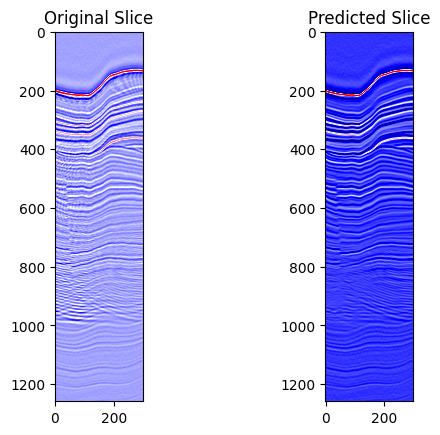

Epoch [44/200], Train Loss: 59.6956, Train SSIM: 0.9820,           Val Loss: 825.0597, Val SSIM: 0.8577


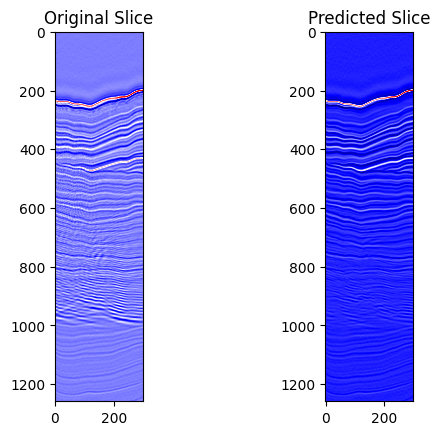

Epoch [45/200], Train Loss: 57.5781, Train SSIM: 0.9828,           Val Loss: 833.1236, Val SSIM: 0.8489


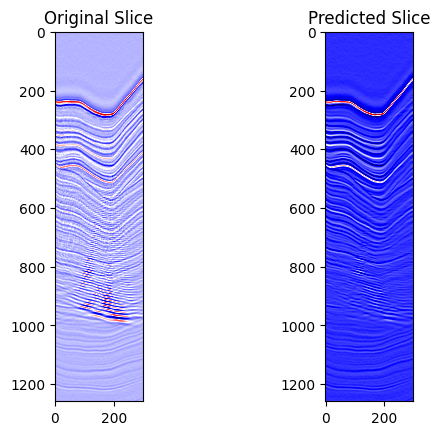

Epoch [46/200], Train Loss: 64.3374, Train SSIM: 0.9817,           Val Loss: 741.8757, Val SSIM: 0.8684


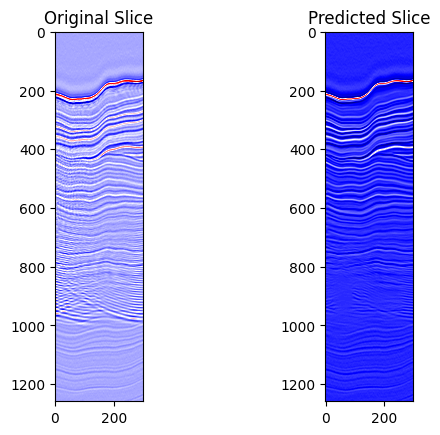

Epoch [47/200], Train Loss: 61.7024, Train SSIM: 0.9820,           Val Loss: 976.4521, Val SSIM: 0.8340


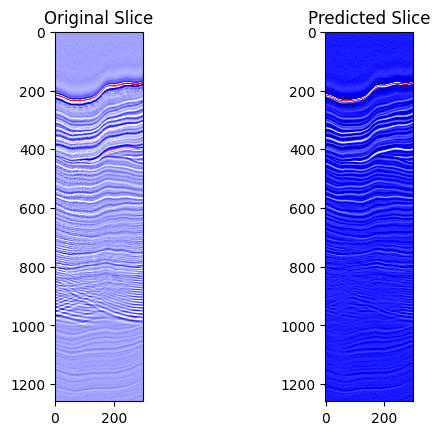

Epoch [48/200], Train Loss: 59.2050, Train SSIM: 0.9831,           Val Loss: 1075.7213, Val SSIM: 0.8214


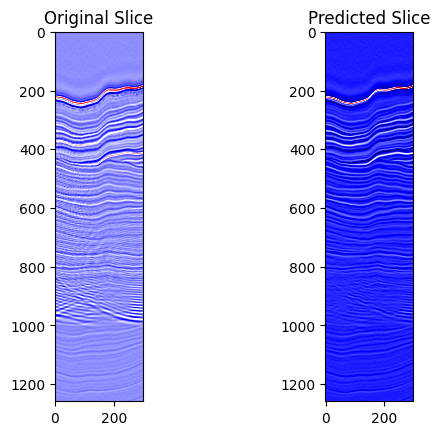

Epoch [49/200], Train Loss: 59.5339, Train SSIM: 0.9826,           Val Loss: 771.5232, Val SSIM: 0.8910


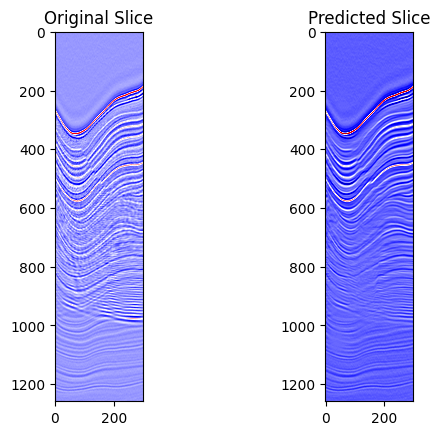

Epoch [50/200], Train Loss: 58.1544, Train SSIM: 0.9827,           Val Loss: 887.2788, Val SSIM: 0.8776


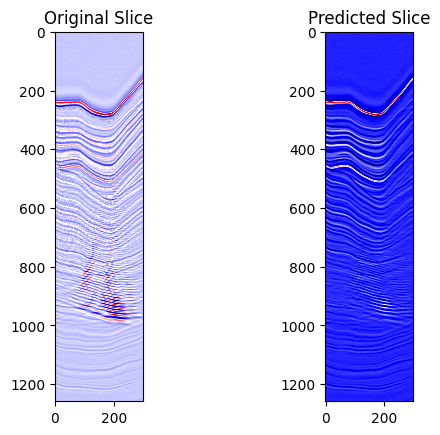

Epoch [51/200], Train Loss: 58.9220, Train SSIM: 0.9828,           Val Loss: 894.3250, Val SSIM: 0.8799


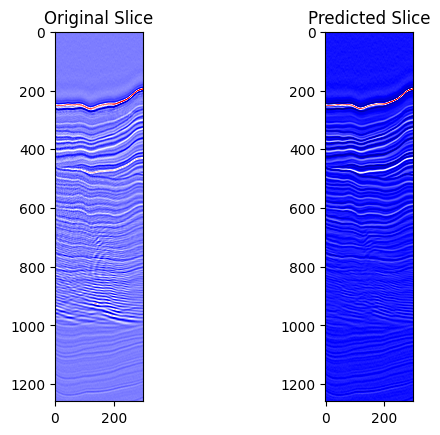

Epoch [52/200], Train Loss: 54.4452, Train SSIM: 0.9839,           Val Loss: 806.5310, Val SSIM: 0.8875


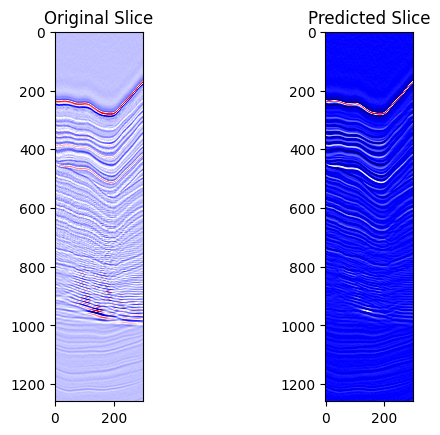

Epoch [53/200], Train Loss: 50.4440, Train SSIM: 0.9849,           Val Loss: 828.5942, Val SSIM: 0.8800


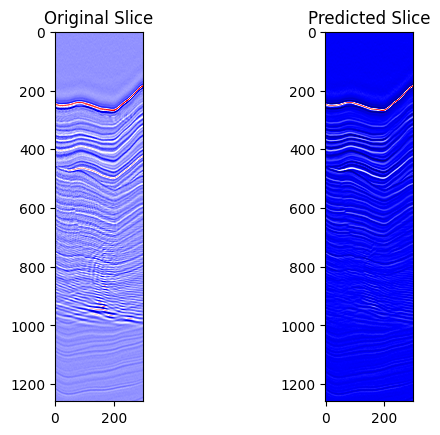

Epoch [54/200], Train Loss: 52.3036, Train SSIM: 0.9848,           Val Loss: 884.3211, Val SSIM: 0.8564


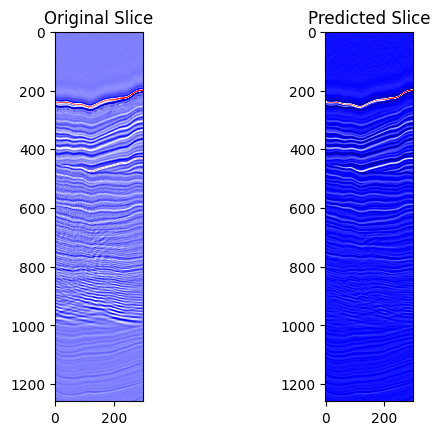

Epoch [55/200], Train Loss: 58.0462, Train SSIM: 0.9834,           Val Loss: 832.2635, Val SSIM: 0.8720


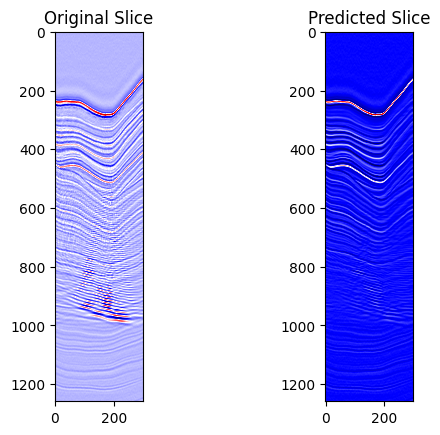

Epoch [56/200], Train Loss: 59.2156, Train SSIM: 0.9833,           Val Loss: 951.0831, Val SSIM: 0.8542


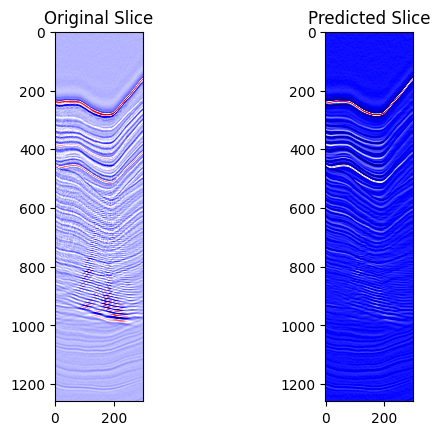

Epoch [57/200], Train Loss: 55.3075, Train SSIM: 0.9840,           Val Loss: 945.1181, Val SSIM: 0.8650


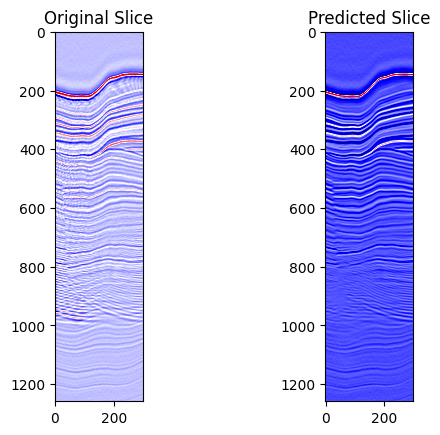

Epoch [58/200], Train Loss: 54.9006, Train SSIM: 0.9846,           Val Loss: 844.1564, Val SSIM: 0.8520


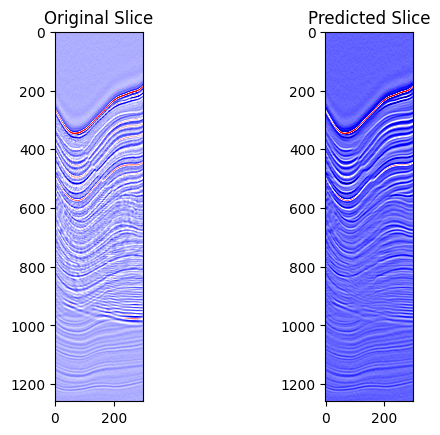

Epoch [59/200], Train Loss: 50.2658, Train SSIM: 0.9851,           Val Loss: 812.2822, Val SSIM: 0.8892


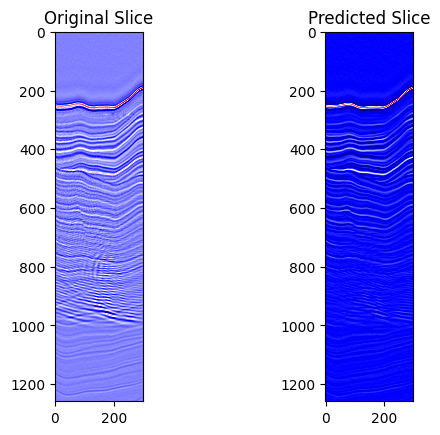

Epoch [60/200], Train Loss: 50.2430, Train SSIM: 0.9850,           Val Loss: 864.9428, Val SSIM: 0.8732


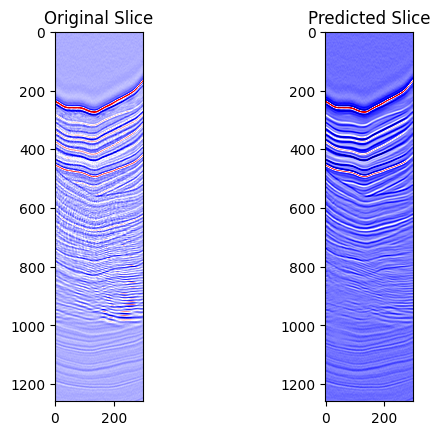

Epoch [61/200], Train Loss: 53.3395, Train SSIM: 0.9850,           Val Loss: 841.4774, Val SSIM: 0.8732


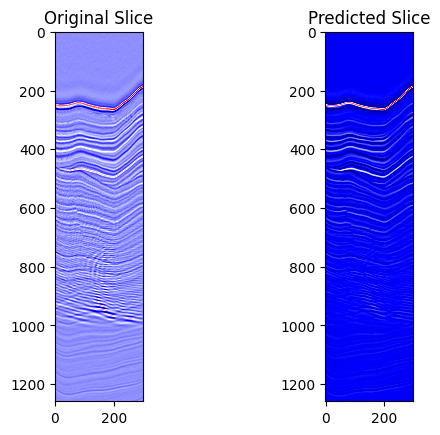

Epoch [62/200], Train Loss: 54.4288, Train SSIM: 0.9846,           Val Loss: 917.7091, Val SSIM: 0.8272


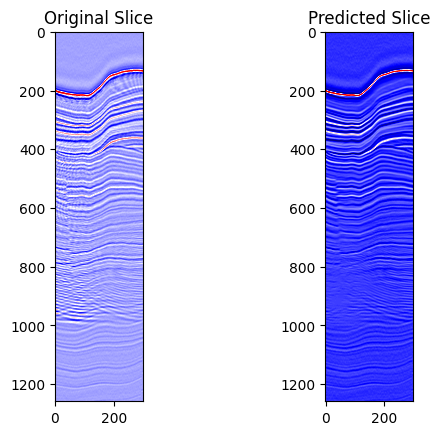

Epoch [63/200], Train Loss: 45.6643, Train SSIM: 0.9862,           Val Loss: 928.3673, Val SSIM: 0.8580


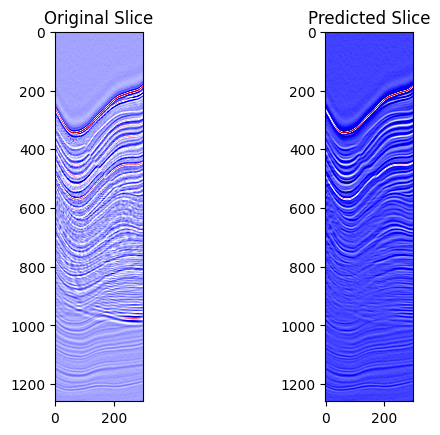

Epoch [64/200], Train Loss: 56.0724, Train SSIM: 0.9845,           Val Loss: 1061.7705, Val SSIM: 0.7817


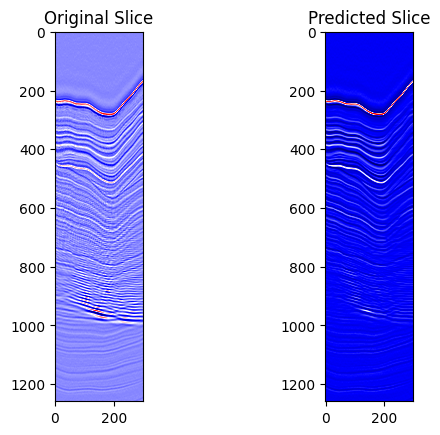

Epoch [65/200], Train Loss: 48.5636, Train SSIM: 0.9856,           Val Loss: 991.6226, Val SSIM: 0.8359


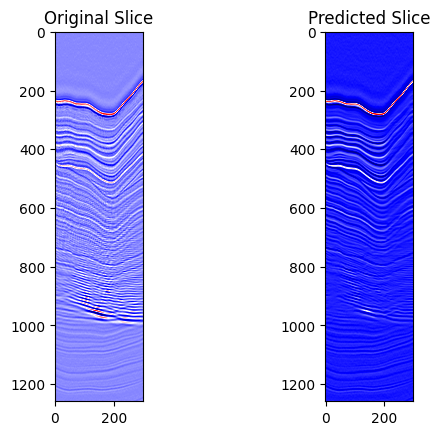

Epoch [66/200], Train Loss: 47.5683, Train SSIM: 0.9861,           Val Loss: 776.4102, Val SSIM: 0.8760


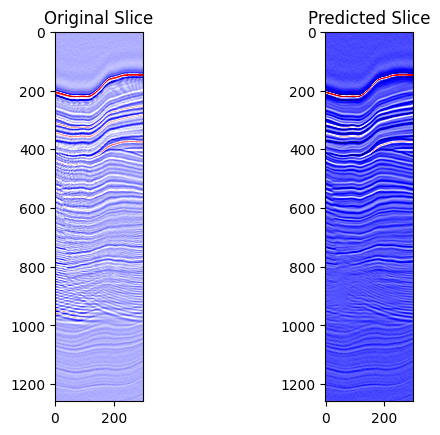

Epoch [67/200], Train Loss: 47.1324, Train SSIM: 0.9865,           Val Loss: 811.6156, Val SSIM: 0.8838


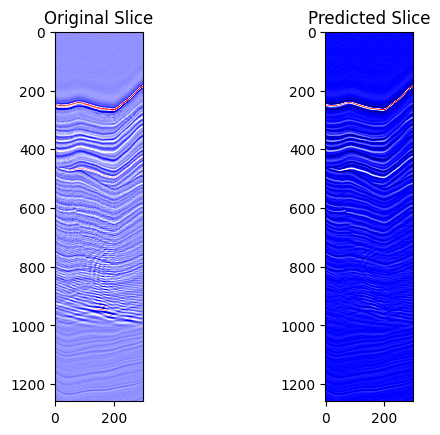

Epoch [68/200], Train Loss: 47.1185, Train SSIM: 0.9868,           Val Loss: 911.5850, Val SSIM: 0.8526


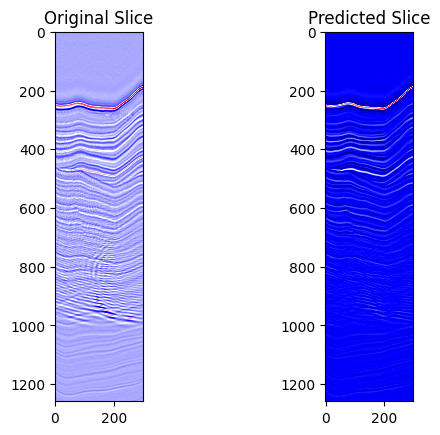

Epoch [69/200], Train Loss: 47.5276, Train SSIM: 0.9862,           Val Loss: 1057.6554, Val SSIM: 0.8498


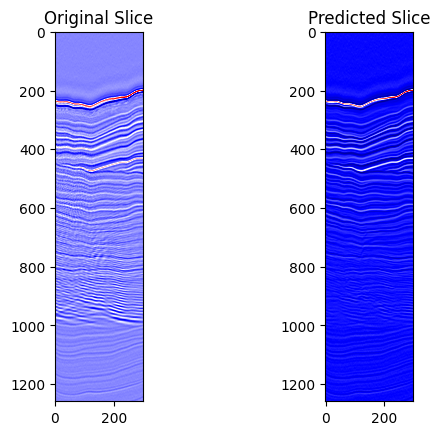

Epoch [70/200], Train Loss: 48.7698, Train SSIM: 0.9861,           Val Loss: 923.3284, Val SSIM: 0.8681


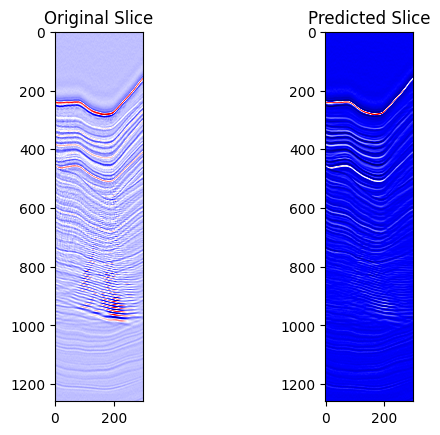

Epoch [71/200], Train Loss: 49.8353, Train SSIM: 0.9863,           Val Loss: 1044.3587, Val SSIM: 0.8510


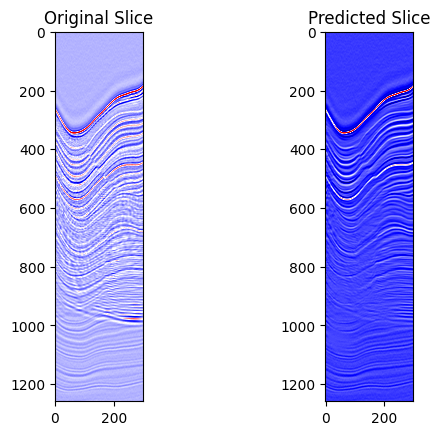

Epoch [72/200], Train Loss: 52.0346, Train SSIM: 0.9855,           Val Loss: 1029.5074, Val SSIM: 0.8494


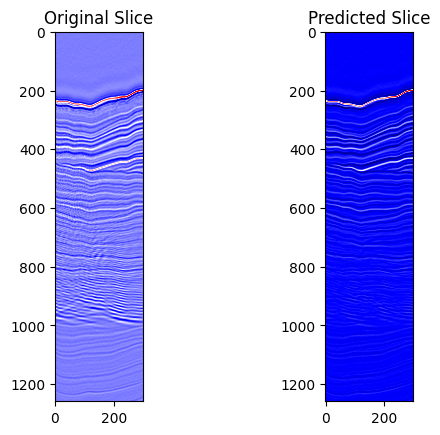

Epoch [73/200], Train Loss: 43.1052, Train SSIM: 0.9872,           Val Loss: 904.1017, Val SSIM: 0.8768


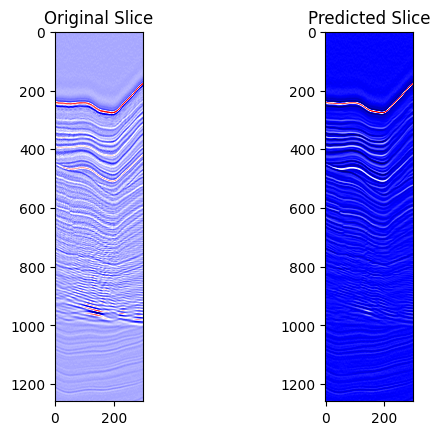

Epoch [74/200], Train Loss: 48.3348, Train SSIM: 0.9870,           Val Loss: 772.6258, Val SSIM: 0.8808


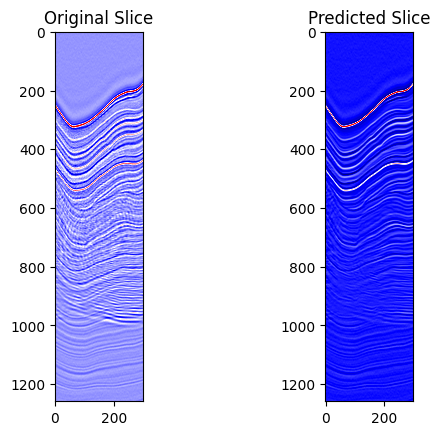

Epoch [75/200], Train Loss: 45.8677, Train SSIM: 0.9867,           Val Loss: 970.8049, Val SSIM: 0.8672


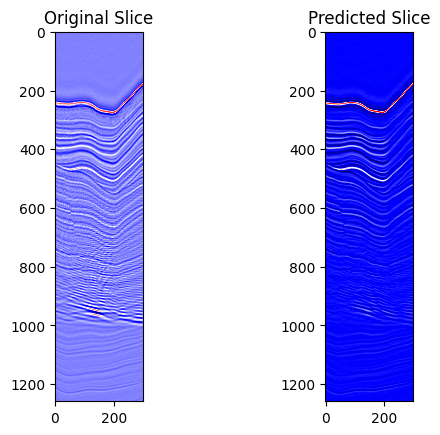

Epoch [76/200], Train Loss: 43.9588, Train SSIM: 0.9873,           Val Loss: 899.8408, Val SSIM: 0.8580


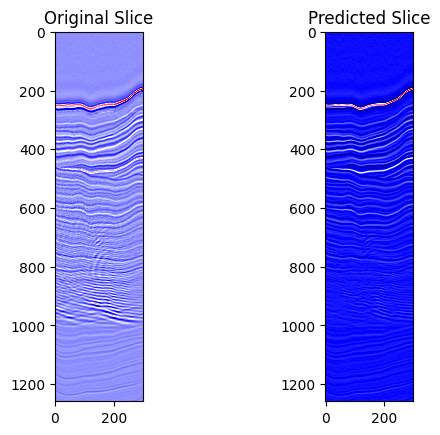

Epoch [77/200], Train Loss: 46.8246, Train SSIM: 0.9865,           Val Loss: 844.0574, Val SSIM: 0.8774


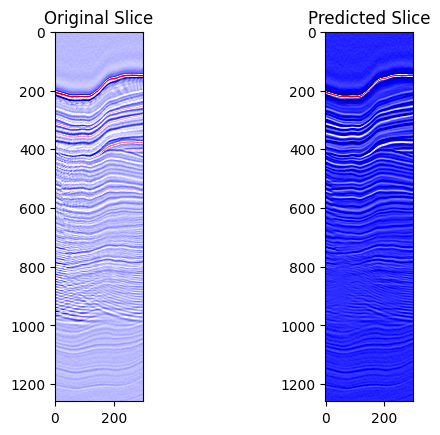

Epoch [78/200], Train Loss: 44.1670, Train SSIM: 0.9878,           Val Loss: 924.9509, Val SSIM: 0.8517


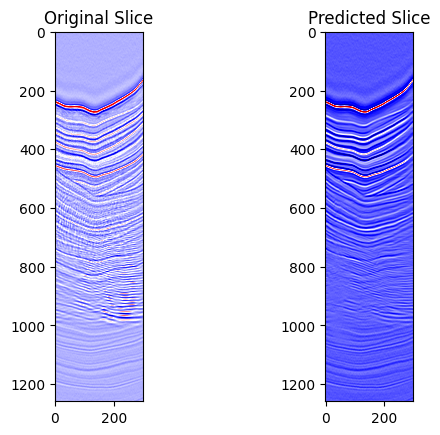

Epoch [79/200], Train Loss: 41.1168, Train SSIM: 0.9882,           Val Loss: 1005.7690, Val SSIM: 0.8410


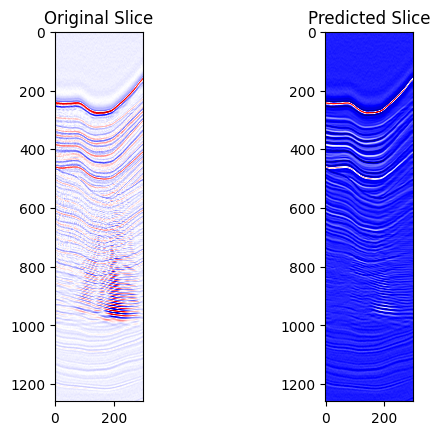

Epoch [80/200], Train Loss: 44.2678, Train SSIM: 0.9876,           Val Loss: 1002.7209, Val SSIM: 0.8496


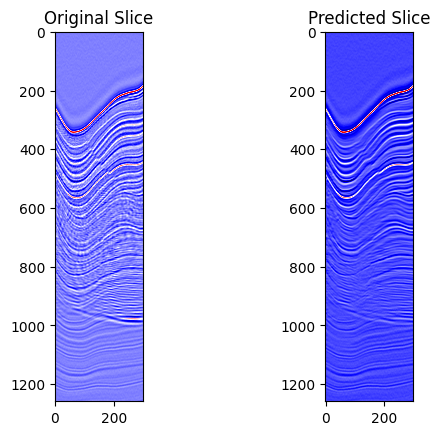

Epoch [81/200], Train Loss: 45.1826, Train SSIM: 0.9872,           Val Loss: 887.9849, Val SSIM: 0.8388


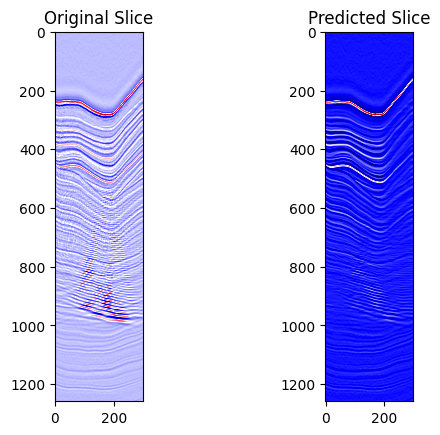

Epoch [82/200], Train Loss: 41.0829, Train SSIM: 0.9876,           Val Loss: 914.3378, Val SSIM: 0.8566


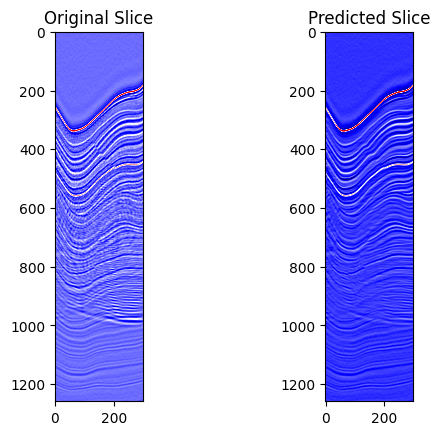

Epoch [83/200], Train Loss: 41.7593, Train SSIM: 0.9884,           Val Loss: 900.1768, Val SSIM: 0.8691


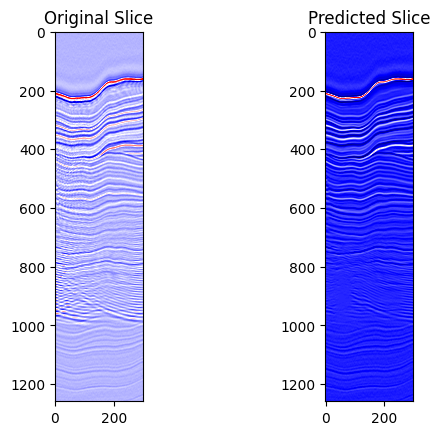

Epoch [84/200], Train Loss: 42.4297, Train SSIM: 0.9874,           Val Loss: 961.3377, Val SSIM: 0.8528


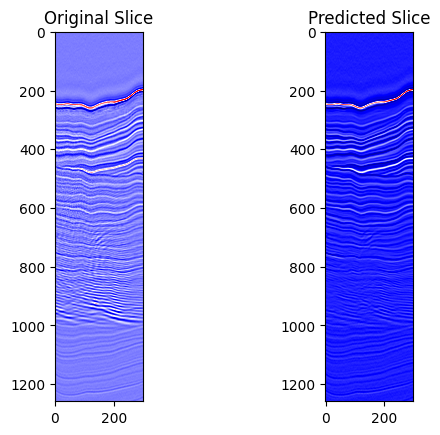

Epoch [85/200], Train Loss: 37.6734, Train SSIM: 0.9887,           Val Loss: 758.3775, Val SSIM: 0.8792


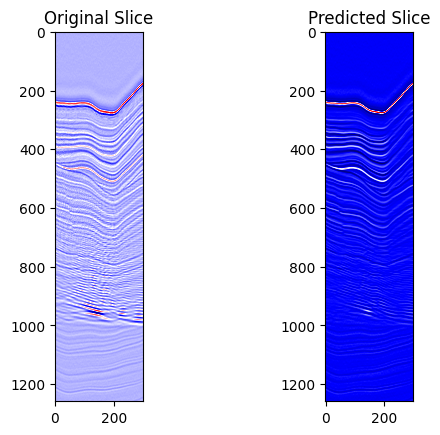

Epoch [86/200], Train Loss: 35.1879, Train SSIM: 0.9889,           Val Loss: 905.6790, Val SSIM: 0.8757


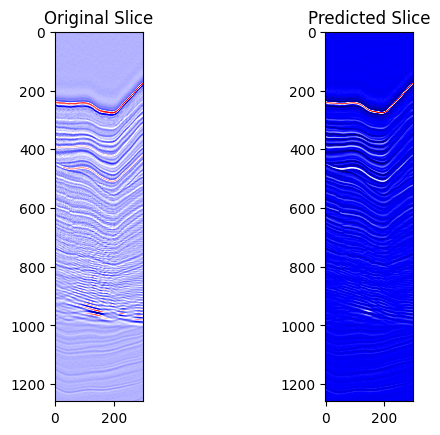

Epoch [87/200], Train Loss: 38.2169, Train SSIM: 0.9885,           Val Loss: 856.8009, Val SSIM: 0.8746


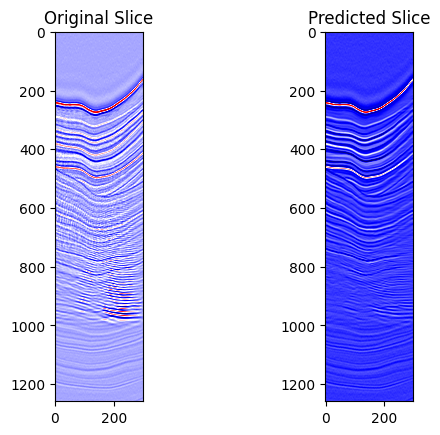

Epoch [88/200], Train Loss: 37.7350, Train SSIM: 0.9885,           Val Loss: 920.8665, Val SSIM: 0.8634


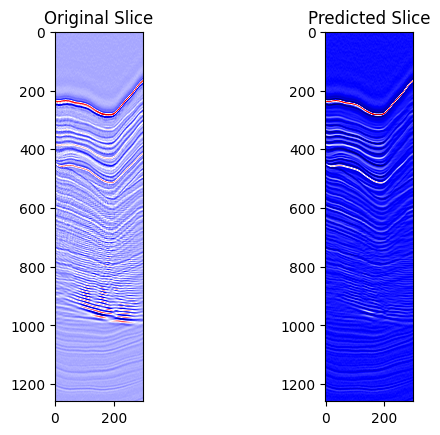

Epoch [89/200], Train Loss: 43.5560, Train SSIM: 0.9877,           Val Loss: 856.4668, Val SSIM: 0.8697


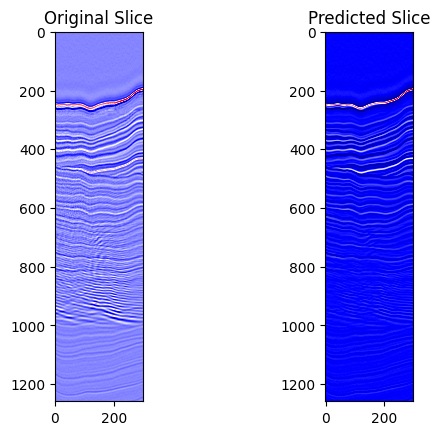

Epoch [90/200], Train Loss: 38.0968, Train SSIM: 0.9885,           Val Loss: 878.0558, Val SSIM: 0.8438


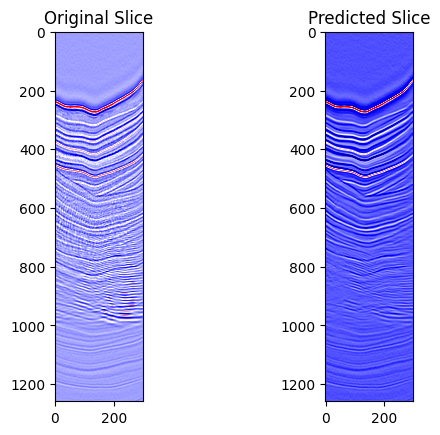

Epoch [91/200], Train Loss: 43.0740, Train SSIM: 0.9868,           Val Loss: 938.9331, Val SSIM: 0.8635


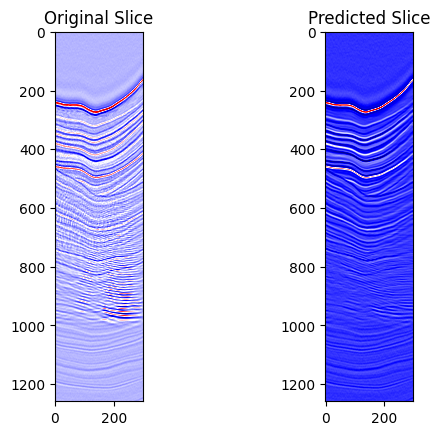

Epoch [92/200], Train Loss: 38.7063, Train SSIM: 0.9883,           Val Loss: 913.9850, Val SSIM: 0.8664


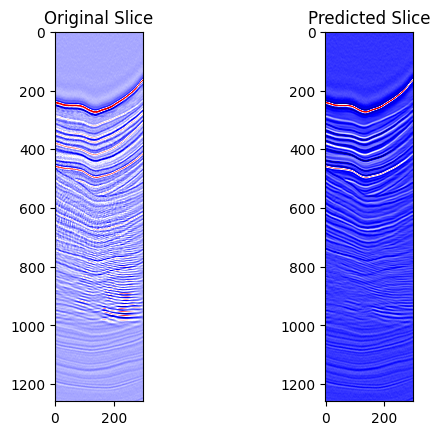

Epoch [93/200], Train Loss: 35.2328, Train SSIM: 0.9892,           Val Loss: 932.3776, Val SSIM: 0.8746


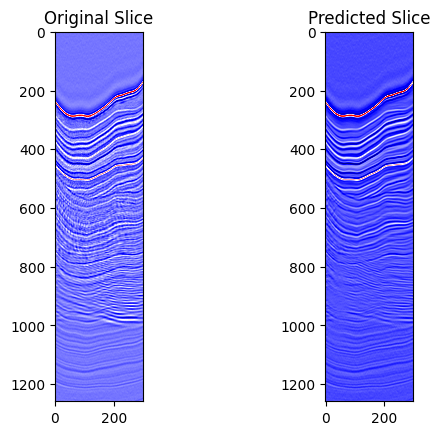

Epoch [94/200], Train Loss: 33.5548, Train SSIM: 0.9899,           Val Loss: 945.7043, Val SSIM: 0.8528


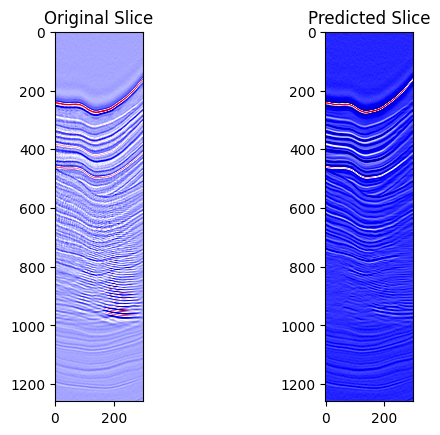

Epoch [95/200], Train Loss: 37.4894, Train SSIM: 0.9888,           Val Loss: 991.7180, Val SSIM: 0.8497


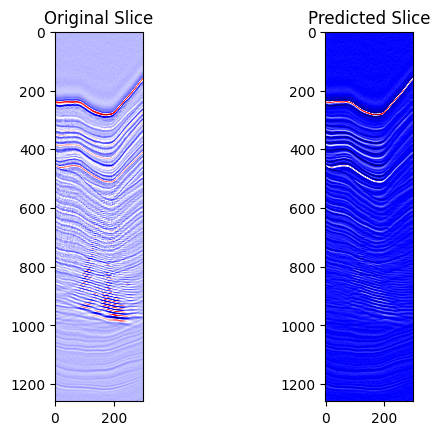

Epoch [96/200], Train Loss: 40.5756, Train SSIM: 0.9874,           Val Loss: 970.3033, Val SSIM: 0.8432


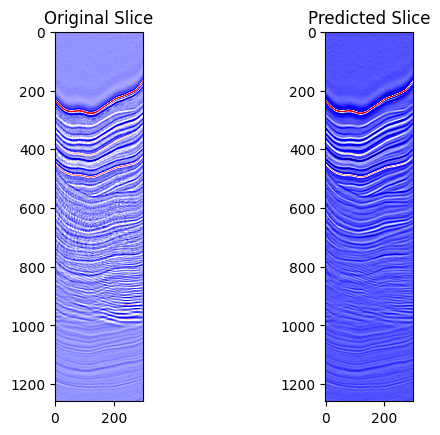

Epoch [97/200], Train Loss: 40.0018, Train SSIM: 0.9883,           Val Loss: 948.1268, Val SSIM: 0.8552


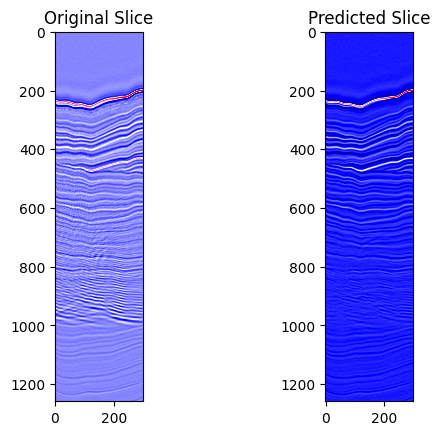

Epoch [98/200], Train Loss: 40.0638, Train SSIM: 0.9875,           Val Loss: 919.0406, Val SSIM: 0.8640


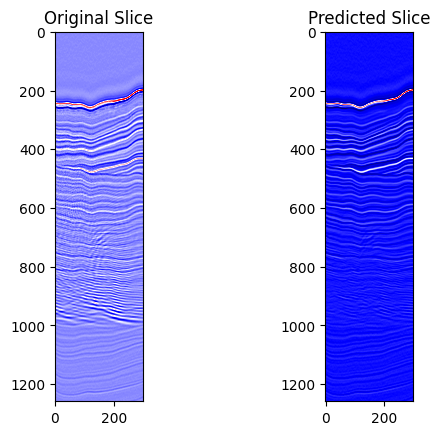

Epoch [99/200], Train Loss: 36.1281, Train SSIM: 0.9894,           Val Loss: 926.1505, Val SSIM: 0.8587


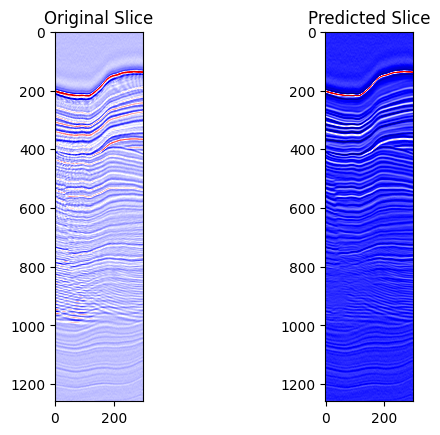

Epoch [100/200], Train Loss: 34.5402, Train SSIM: 0.9898,           Val Loss: 973.7003, Val SSIM: 0.8423


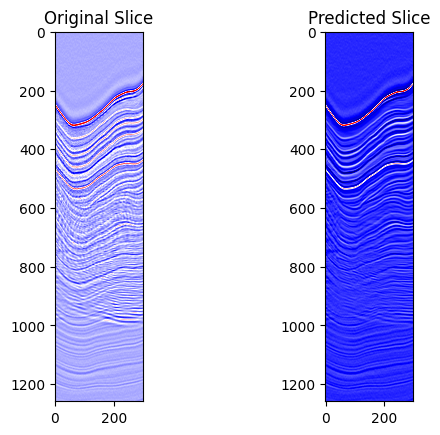

Epoch [101/200], Train Loss: 36.8510, Train SSIM: 0.9893,           Val Loss: 961.5343, Val SSIM: 0.8631


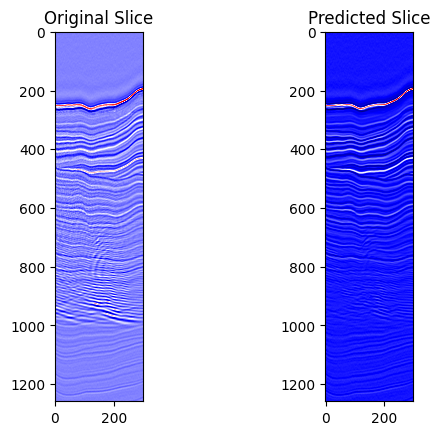

Epoch [102/200], Train Loss: 40.3052, Train SSIM: 0.9881,           Val Loss: 1053.2644, Val SSIM: 0.7782


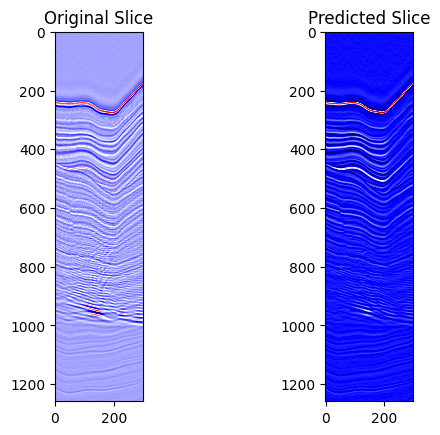

Epoch [103/200], Train Loss: 34.4492, Train SSIM: 0.9896,           Val Loss: 962.1836, Val SSIM: 0.8411


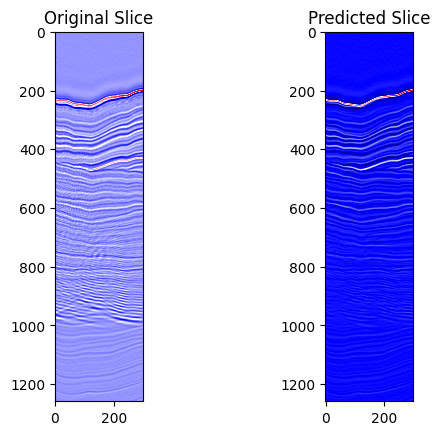

Epoch [104/200], Train Loss: 32.7885, Train SSIM: 0.9899,           Val Loss: 964.8680, Val SSIM: 0.8604


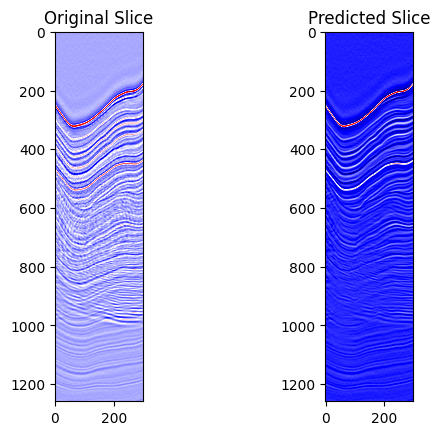

Epoch [105/200], Train Loss: 31.4637, Train SSIM: 0.9901,           Val Loss: 1002.5006, Val SSIM: 0.8463


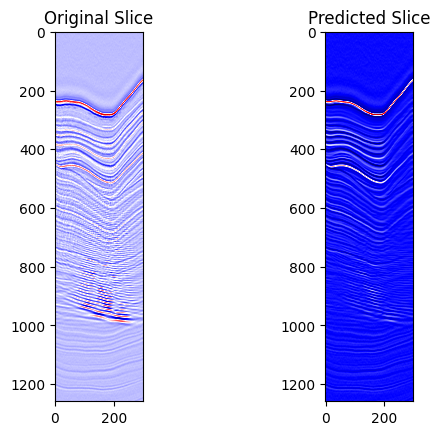

Epoch [106/200], Train Loss: 34.0824, Train SSIM: 0.9901,           Val Loss: 965.6897, Val SSIM: 0.8305


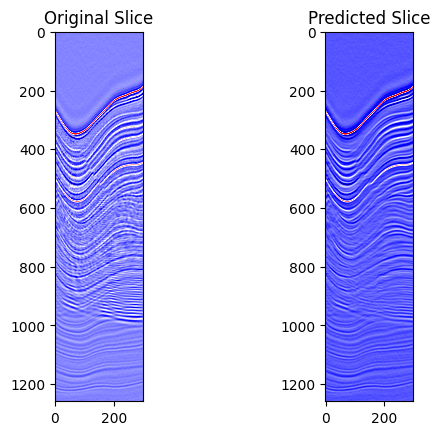

Epoch [107/200], Train Loss: 36.6490, Train SSIM: 0.9892,           Val Loss: 844.7790, Val SSIM: 0.8806


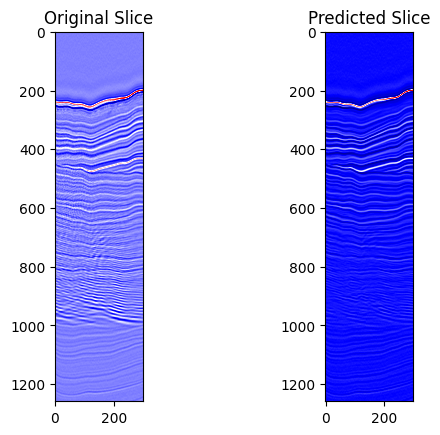

Epoch [108/200], Train Loss: 35.0107, Train SSIM: 0.9897,           Val Loss: 962.2028, Val SSIM: 0.8663


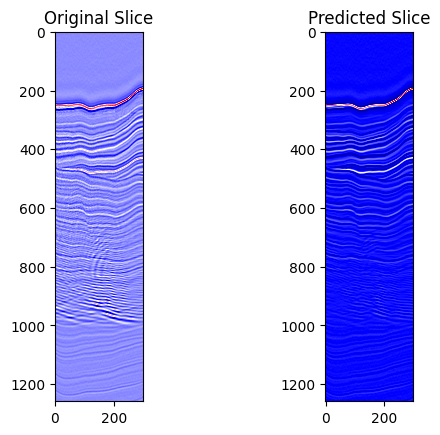

Epoch [109/200], Train Loss: 30.2810, Train SSIM: 0.9908,           Val Loss: 884.5649, Val SSIM: 0.8575


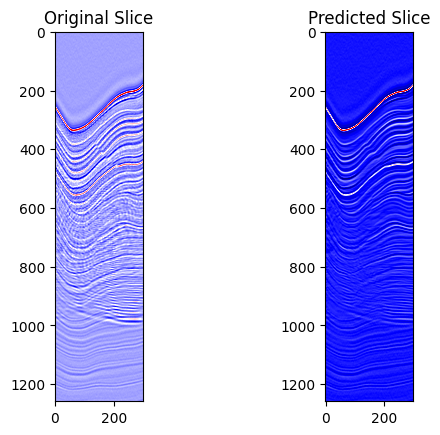

Epoch [110/200], Train Loss: 29.5648, Train SSIM: 0.9907,           Val Loss: 936.8219, Val SSIM: 0.8776


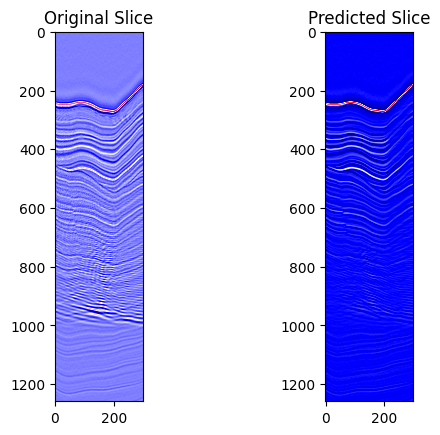

Epoch [111/200], Train Loss: 28.3715, Train SSIM: 0.9912,           Val Loss: 1111.1776, Val SSIM: 0.8418


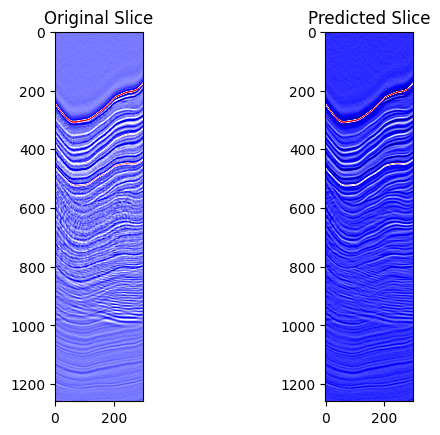

Epoch [112/200], Train Loss: 32.2487, Train SSIM: 0.9906,           Val Loss: 886.3985, Val SSIM: 0.8802


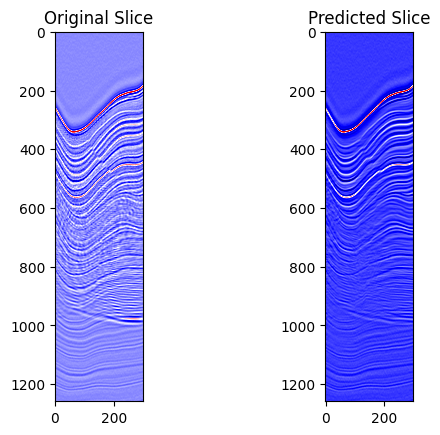

Epoch [113/200], Train Loss: 30.1370, Train SSIM: 0.9905,           Val Loss: 1008.2657, Val SSIM: 0.8397


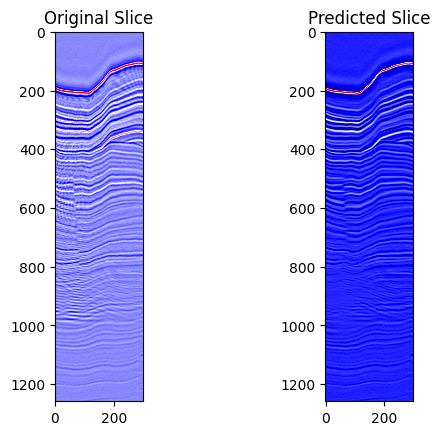

Epoch [114/200], Train Loss: 33.1704, Train SSIM: 0.9901,           Val Loss: 897.5625, Val SSIM: 0.8256


In [ ]:
# Number of epochs
num_epochs = 200

# Training loop
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    running_ssim = 0.0

    for x_batch, y_batch in train_loader:
        optimizer.zero_grad()
        outputs = model(x_batch)
        loss = criterion(outputs, y_batch)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
        batch_ssim = ssim_metric(outputs.detach(), y_batch.detach())
        running_ssim += batch_ssim.item()

    # Validation phase
    model.eval()
    val_loss = 0.0
    val_ssim = 0.0
    with torch.no_grad():
        for x_val, y_val in val_loader:
            val_outputs = model(x_val)
            val_loss += criterion(val_outputs, y_val).item()
            val_ssim += ssim_metric(val_outputs, y_val).item()

    # Prediction on a single slice from X_slices_t
    random_slice = X_slices_t[torch.randint(0, len(X_slices_t), (1,)).item()]

    # Convert to PyTorch tensor and add batch and channel dimensions
    random_slice = torch.tensor(random_slice, dtype=torch.float32).unsqueeze(0).unsqueeze(0)

    prediction = model(random_slice).detach()

    # Visualize the original and predicted slice
    plt.subplot(1, 2, 1)
    plt.title("Original Slice")
    plt.imshow(random_slice.squeeze().cpu().numpy(), cmap='seismic')

    plt.subplot(1, 2, 2)
    plt.title("Predicted Slice")
    plt.imshow(prediction.squeeze().cpu().numpy(), cmap='seismic')
    plt.show()

    print(f"Epoch [{epoch + 1}/{num_epochs}], Train Loss: {running_loss / len(train_loader):.4f}, Train SSIM: {running_ssim / len(train_loader):.4f}, \
          Val Loss: {val_loss / len(val_loader):.4f}, Val SSIM: {val_ssim / len(val_loader):.4f}")


print("Training complete!")
